# LemoScan AI | Manual similarity review

**Human decisions only. No dataset edits, split creation, inference changes, or training.**

This notebook reuses notebook 01's metrics and provides a prioritized cross-split A?D review queue. C/D ambiguity is the main workload; A/B are separate context sets. E pairs are excluded. Similarity scores, filenames, and review components do not establish biological identity.

Run all cells in order. Dependencies: NumPy, Pandas, Pillow, Matplotlib, IPython; no automatic installation. Dataset content and input report hashes are checked. `manual_review_decisions.csv` is created once with blank decision/notes columns and is **never overwritten on rerun**. Other new review artifacts may be refreshed.


## 1. Load existing evidence and validate references
Root discovery supports the project directory and its children; set the override if needed. All referenced images must exist under `dataset/`, agree with inventory SHA-256 values, and remain unchanged during execution. The original candidate pool and expanded filename-neighbor pool are reported separately.


In [1]:
from pathlib import Path
from collections import defaultdict
import hashlib
import json
import re
import math
import numpy as np
import pandas as pd
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

PROJECT_ROOT_OVERRIDE = None
TOP_PRIORITY_CASES = 25
PAIRS_PER_SECTION = 3
MAX_GROUP_SHEETS = 3
MAX_GROUP_IMAGES = 8
SEED = 42
SPLITS = ("train", "val", "test")


def resolve_root(override=None):
    candidates = [Path(override).expanduser().resolve()] if override else [Path.cwd().resolve(), *Path.cwd().resolve().parents]
    for candidate in candidates:
        if (candidate / "dataset").is_dir() and (candidate / "utils/model_loader.py").is_file():
            return candidate
    raise FileNotFoundError("Set PROJECT_ROOT_OVERRIDE to the project root.")


ROOT = resolve_root(PROJECT_ROOT_OVERRIDE)
DATASET = (ROOT / "dataset").resolve()
REPORTS = ROOT / "reports/dataset_audit"
OUTPUT = REPORTS / "manual_review_contact_sheets"
assert not REPORTS.resolve().is_relative_to(DATASET)
INPUT_NAMES = ["similarity_review.csv", "dhash_zero_review.csv", "duplicate_clusters.csv",
               "grouping_manifest.csv", "capture_sequence_candidates.csv", "image_inventory.csv"]
missing = [name for name in INPUT_NAMES if not (REPORTS / name).is_file()]
if missing: raise FileNotFoundError(f"Missing prior review reports: {missing}")
data = {name: pd.read_csv(REPORTS / name, keep_default_na=False) for name in INPUT_NAMES}
similarity = data["similarity_review.csv"]
zero_input = data["dhash_zero_review.csv"]
clusters = data["duplicate_clusters.csv"]
manifest = data["grouping_manifest.csv"]
prior_sequences = data["capture_sequence_candidates.csv"]
inventory = data["image_inventory.csv"]
assert inventory.filepath.is_unique and manifest.filepath.is_unique
assert set(inventory.filepath) == set(manifest.filepath)
records = inventory.set_index("filepath").to_dict("index")


def file_hash(path):
    digest = hashlib.sha256()
    with path.open("rb") as handle:
        for chunk in iter(lambda: handle.read(1024 * 1024), b""):
            digest.update(chunk)
    return digest.hexdigest()


def image_path(relative):
    target = (ROOT / relative).resolve()
    if not target.is_relative_to(DATASET) or not target.is_file():
        raise ValueError(f"Missing or unsafe image reference: {relative}")
    return target


def snapshot():
    return {p.relative_to(ROOT).as_posix(): (p.stat().st_size, p.stat().st_mtime_ns, file_hash(p))
            for p in sorted(DATASET.rglob("*")) if p.is_file()}


references = set(records)
for frame, fields in [(similarity, ["filepath_a", "filepath_b"]), (zero_input, ["filepath_a", "filepath_b"]),
                      (clusters, ["filepath"]), (manifest, ["filepath"]), (prior_sequences, ["filepath"])]:
    for field in fields: references.update(frame[field])
assert references <= set(records), "A report references images outside the inventory."
for path in sorted(references): image_path(path)
BEFORE = snapshot()
for path, row in records.items():
    assert BEFORE[path][2] == row["sha256"], f"Stale inventory: {path}"
for side in ("a", "b"):
    for row in similarity.to_dict("records"):
        original = records[row[f"filepath_{side}"]]
        for field in ("class", "split", "sha256"):
            assert original[field] == row[f"{field}_{side}"]
for row in manifest.to_dict("records"):
    assert row["sha256"] == records[row["filepath"]]["sha256"]
INPUT_HASHES = {name: file_hash(REPORTS / name) for name in INPUT_NAMES}
print(f"Validated {len(inventory):,} images and six report inputs.")
print("Expanded cross-split counts:")
display(similarity.loc[similarity.cross_split].category.value_counts().sort_index().rename("pairs").to_frame())
print("Original audit pool, separately:")
display(similarity.loc[similarity.cross_split & similarity.is_audit_near_candidate].category.value_counts().sort_index().rename("pairs").to_frame())


Validated 2,050 images and six report inputs.
Expanded cross-split counts:
Original audit pool, separately:


,pairs
category,
A,1
B,7
C,276
D,243
E,632


,pairs
category,
B,7
C,263
D,187
E,19


## 2. Transparent review-priority score
Priority is an ordering aid, **not a duplicate probability**.

`review_priority = split_base + category + dHash + pHash + pixel + color + class + date + number`

| Component | Exact contribution |
|---|---|
| Split base | train?test: 300; train?val: 200; val?test: 100 |
| Category | C: 20; D: 10; A/B: 20 (context sets only) |
| dHash | 15 ? clip(1 ? distance/64, 0, 1) |
| pHash | 15 ? clip(1 ? distance/63, 0, 1) |
| Pixel | 15 ? clip(1 ? normalized MAE/0.10, 0, 1) |
| Color | 10 ? clip(histogram intersection, 0, 1) |
| Same class | 5 if equal, otherwise 0 |
| Same date token | 5 if nonempty tokens agree, otherwise 0 |
| Number proximity | 5 ? max(0, 1 ? gap/5), only if class/date agree |

Non-split contributions are at most 90, so split concern always takes precedence. Date/number cues have limited weight and never assert identity. Stable SHA-256 pair IDs break ties deterministically. ?Highest priority? means the first configurable 25 C/D cases, an operational review batch rather than a scientific threshold.


In [2]:
def date_and_number(filename):
    date = re.search(r"(?<!\d)((?:19|20)\d{2})[-_](\d{2})[-_](\d{2})(?!\d)", filename)
    number = re.search(r"(?:^|[^A-Za-z])IMG[ _(-]*(\d+)", filename, re.IGNORECASE)
    return ("-".join(date.groups()) if date else "", int(number.group(1)) if number else None)


def stable_pair_id(first, second):
    return "pair_" + hashlib.sha256(json.dumps(sorted([first, second]), ensure_ascii=False).encode("utf-8")).hexdigest()[:20]


queue = similarity.loc[similarity.cross_split & similarity.category.isin(["A", "B", "C", "D"])].copy()
assert (queue.filepath_a != queue.filepath_b).all()
queue["pair_id"] = [stable_pair_id(a, b) for a, b in zip(queue.filepath_a, queue.filepath_b)]
assert queue.pair_id.is_unique
queue["similarity_category"] = queue.category
queue["score_split"] = queue.split_combination.map({"train-test": 300, "train-val": 200, "val-test": 100})
assert queue.score_split.notna().all()
queue["score_category"] = queue.category.map({"A": 20, "B": 20, "C": 20, "D": 10})
queue["score_dhash"] = 15 * (1 - queue.dhash_distance / 64).clip(0, 1)
queue["score_phash"] = 15 * (1 - queue.phash_distance / 63).clip(0, 1)
queue["score_pixel"] = 15 * (1 - queue.normalized_pixel_mae / 0.10).clip(0, 1)
queue["score_color"] = 10 * queue.color_histogram_intersection.clip(0, 1)
queue["score_class"] = 5 * queue.class_a.eq(queue.class_b).astype(int)
dates_a, dates_b, numbers_a, numbers_b = [], [], [], []
for a, b in zip(queue.filename_a, queue.filename_b):
    da, na = date_and_number(a); db, nb = date_and_number(b)
    dates_a.append(da); dates_b.append(db); numbers_a.append(na); numbers_b.append(nb)
queue["date_token_a"], queue["date_token_b"] = dates_a, dates_b
queue["image_number_a"], queue["image_number_b"] = numbers_a, numbers_b
queue["same_date_token"] = queue.date_token_a.ne("") & queue.date_token_a.eq(queue.date_token_b)
queue["score_date"] = 5 * queue.same_date_token.astype(int)
queue["number_gap"] = (pd.to_numeric(queue.image_number_a) - pd.to_numeric(queue.image_number_b)).abs()
queue["score_number"] = (5 * (1 - queue.number_gap / 5).clip(0, 1)).fillna(0)
queue.loc[~(queue.same_date_token & queue.class_a.eq(queue.class_b)), "score_number"] = 0
score_columns = [name for name in queue if name.startswith("score_")]
queue["review_priority"] = queue[score_columns].sum(axis=1).round(6)
queue = queue.sort_values(["review_priority", "pair_id"], ascending=[False, True]).reset_index(drop=True)
ambiguous = queue.loc[queue.category.isin(["C", "D"])].copy()
priority_ids = set(ambiguous.head(TOP_PRIORITY_CASES).pair_id)
queue["highest_priority_batch"] = queue.pair_id.isin(priority_ids)
queue["ambiguity_rank"] = queue.pair_id.map({pair: i + 1 for i, pair in enumerate(ambiguous.pair_id)})
print(f"Human-review cases: {len(queue)}; C/D cases: {len(ambiguous)}; first batch: {len(priority_ids)}")
display(queue.loc[queue.highest_priority_batch, ["pair_id", "split_combination", "category", "review_priority", *score_columns]].head(10))


Human-review cases: 527; C/D cases: 519; first batch: 25


,pair_id,split_combination,category,review_priority,score_split,score_category,score_dhash,score_phash,score_pixel,score_color,score_class,score_date,score_number
0,pair_fda9158bbfa0a0780d61,train-test,C,388.048330,300,20,15.000000,15.00000,14.250153,9.798177,5,5,4.0
1,pair_3e0bf1dedea60d5059ca,train-test,C,387.971546,300,20,15.000000,15.00000,14.218942,9.752604,5,5,4.0
2,pair_25a2694ff244012ff7bf,train-test,C,387.475988,300,20,14.531250,15.00000,14.153885,9.790853,5,5,4.0
3,pair_1c2dae0fa7db18f1ac06,train-test,C,387.462489,300,20,14.765625,15.00000,13.993088,9.703776,5,5,4.0
4,pair_acb0077049d73b29b590,train-test,C,387.370768,300,20,14.531250,15.00000,14.101563,9.737956,5,5,4.0
5,pair_5beed25e60799f5b4f06,train-test,C,387.151931,300,20,14.765625,14.52381,14.083850,9.778646,5,5,4.0
6,pair_193158187c98565cbd7f,train-test,C,387.131921,300,20,14.765625,14.52381,14.132200,9.710286,5,5,4.0
7,pair_228c12bcc190d330752b,train-test,C,387.110974,300,20,14.531250,15.00000,13.822237,9.757487,5,5,4.0
8,pair_dc48a30a3be0a4e62c2e,train-test,C,387.105229,300,20,14.531250,15.00000,13.947515,9.626465,5,5,4.0
9,pair_4b3d6333c05cae4bcfcc,train-test,C,387.095464,300,20,14.531250,15.00000,14.088302,9.475911,5,5,4.0


## 3. Group review context without propagating decisions
A graph connects ambiguous pairs and the prior A/B manifest groups. Connected components organize review context only: they are **not new biological groups or new split assignments**. A component can contain chains whose endpoints are unrelated. Review each named edge once; never assume every pair in a component is SAME_SOURCE. Stable pair IDs and reuse of saved sheets avoid repeated labeling across sections.


In [3]:
def components(nodes, edges):
    neighbors = {p: set() for p in nodes}
    for a, b in edges:
        neighbors[a].add(b); neighbors[b].add(a)
    seen, groups = set(), []
    for start in sorted(neighbors):
        if start in seen: continue
        stack, members = [start], []
        seen.add(start)
        while stack:
            node = stack.pop(); members.append(node)
            for nxt in sorted(neighbors[node], reverse=True):
                if nxt not in seen: seen.add(nxt); stack.append(nxt)
        groups.append(sorted(members))
    return groups


related_nodes = set(queue.filepath_a) | set(queue.filepath_b)
context_edges = list(queue[["filepath_a", "filepath_b"]].itertuples(index=False, name=None))
for _, group in manifest.groupby("visual_group_id", sort=True):
    members = sorted(group.filepath)
    if len(members) > 1 and related_nodes.intersection(members):
        related_nodes.update(members)
        context_edges.extend((members[0], other) for other in members[1:])
context_groups = components(related_nodes, context_edges)
context_ids, context_members = {}, {}
for members in context_groups:
    group_id = "review_group_" + hashlib.sha256(json.dumps(members).encode()).hexdigest()[:12]
    context_members[group_id] = members
    for member in members: context_ids[member] = group_id
queue["review_group_id"] = queue.filepath_a.map(context_ids)
assert (queue.review_group_id == queue.filepath_b.map(context_ids)).all()
queue.to_csv(REPORTS / "manual_review_queue.csv", index=False)
print(f"Logical review components: {len(context_groups)}; largest context: {max(map(len, context_groups), default=0)} images")


Logical review components: 272; largest context: 10 images


## 4. Explicit human decision workflow
Edit only `human_decision` and `review_notes` in the CSV. Leave a decision blank until you have inspected the pair. Allowed values:

- **SAME_SOURCE** ? appears to be the same underlying photograph, leaf, capture burst, crop/re-encoding, or otherwise too closely related to place in separate splits. Explain the observed relationship in notes; this is a grouping judgment, not necessarily byte identity.
- **DIFFERENT** ? visually appears to be genuinely independent examples. Similar species/class alone is insufficient.
- **UNSURE** ? cannot determine reliably. Use this when provenance or original-resolution inspection is needed.

On first run all decisions and notes are blank, including A/B context cases. On subsequent runs the file is read and validated, **not rewritten**. Added/missing case IDs or modified identifying fields cause a stop rather than dropping decisions. No decision is inferred from a metric, component, or another decision.


In [4]:
DECISION_PATH = REPORTS / "manual_review_decisions.csv"
DECISION_COLUMNS = ["pair_id", "filepath_a", "filepath_b", "class_a", "class_b", "split_a", "split_b", "similarity_category", "review_priority", "human_decision", "review_notes"]
ALLOWED_DECISIONS = {"", "SAME_SOURCE", "DIFFERENT", "UNSURE"}
expected = queue[[c for c in DECISION_COLUMNS if c not in ["human_decision", "review_notes"]]].copy()


def validate_decisions(frame, reference):
    if not set(DECISION_COLUMNS) <= set(frame): raise ValueError("Missing decision-file columns.")
    if not frame.pair_id.is_unique: raise ValueError("Duplicate decision pair IDs.")
    if set(frame.pair_id) != set(reference.pair_id):
        raise ValueError("Decision case membership differs. Preserve this file and reconcile manually; no overwrite performed.")
    if not set(frame.human_decision) <= ALLOWED_DECISIONS:
        raise ValueError("Use blank, SAME_SOURCE, DIFFERENT, or UNSURE exactly.")
    left, right = frame.set_index("pair_id"), reference.set_index("pair_id")
    for column in [c for c in reference if c not in ["pair_id", "review_priority"]]:
        if not left[column].sort_index().equals(right[column].sort_index()):
            raise ValueError(f"Identifying field changed: {column}. No overwrite performed.")
    if not np.allclose(pd.to_numeric(left.review_priority.sort_index()), right.review_priority.sort_index(), rtol=0, atol=1e-5):
        raise ValueError("Priority configuration changed; reconcile without overwriting human decisions.")


if DECISION_PATH.exists():
    decisions = pd.read_csv(DECISION_PATH, keep_default_na=False)
    validate_decisions(decisions, expected)
    print("Existing decisions preserved; no write performed.")
else:
    decisions = expected.copy()
    decisions["human_decision"] = ""
    decisions["review_notes"] = ""
    # Exclusive creation prevents an accidental overwrite if another editor creates the file.
    with DECISION_PATH.open("x", encoding="utf-8", newline="") as handle:
        decisions[DECISION_COLUMNS].to_csv(handle, index=False)
    print(f"Created {len(decisions)} cases with blank human decisions and notes.")
DECISIONS_AT_START = file_hash(DECISION_PATH)
print("Decision file:", DECISION_PATH)
display(decisions.human_decision.replace("", "NOT REVIEWED").value_counts().rename("cases").to_frame())


Created 527 cases with blank human decisions and notes.
Decision file: E:\LemoScan-AI\reports\dataset_audit\manual_review_decisions.csv


,cases
human_decision,
NOT REVIEWED,527


## 5. Refined capture-sequence review candidates
The prior 321 sequences are proposals, not same-leaf labels. Retain edges only within a prior sequence, same class/date, number gap ?1, and either A/B or C with **pHash ?4, MAE ?0.03, color intersection ?0.94**. This tightens visual evidence without promoting any pair category. Build connected review candidates from those edges and retain only groups spanning splits. Within-split-only sequences are outside this evaluation-focused review, not declared independent. Transitive chains still require inspection. These candidates do not modify manifest IDs or split assignments.


In [5]:
prior_sequence_map = prior_sequences.set_index("filepath").capture_sequence_id.to_dict()
assert prior_sequences.filepath.is_unique
refinement_edges = []
for row in similarity.to_dict("records"):
    a, b = row["filepath_a"], row["filepath_b"]
    same_prior = a in prior_sequence_map and b in prior_sequence_map and prior_sequence_map[a] == prior_sequence_map[b]
    date_a, num_a = date_and_number(row["filename_a"])
    date_b, num_b = date_and_number(row["filename_b"])
    close_numbers = num_a is not None and num_b is not None and abs(num_a - num_b) <= 1
    visual = row["category"] in ["A", "B"] or (row["category"] == "C" and row["phash_distance"] <= 4 and row["normalized_pixel_mae"] <= 0.03 and row["color_histogram_intersection"] >= 0.94)
    if same_prior and row["class_a"] == row["class_b"] and date_a and date_a == date_b and close_numbers and visual:
        refinement_edges.append(row)
refinement = pd.DataFrame(refinement_edges, columns=similarity.columns)
refinement_nodes = set(refinement.filepath_a) | set(refinement.filepath_b)
refined_groups = [members for members in components(refinement_nodes, refinement[["filepath_a", "filepath_b"]].itertuples(index=False, name=None))
                  if len({records[path]["split"] for path in members}) > 1]
refined_map, refined_rows, refined_members = {}, [], {}
for members in refined_groups:
    group_id = "capture_review_" + hashlib.sha256(json.dumps(members).encode()).hexdigest()[:12]
    refined_members[group_id] = members
    edges = refinement.loc[refinement.filepath_a.isin(members) & refinement.filepath_b.isin(members)]
    for path in members:
        refined_map[path] = group_id
        incident = edges.loc[edges.filepath_a.eq(path) | edges.filepath_b.eq(path)]
        pair_ids = [stable_pair_id(a, b) for a, b in incident[["filepath_a", "filepath_b"]].itertuples(index=False, name=None)]
        date, number = date_and_number(records[path]["filename"])
        refined_rows.append({"refined_capture_group_id": group_id, "filepath": path,
                             "filename": records[path]["filename"], "class": records[path]["class"], "split": records[path]["split"],
                             "date_token": date, "image_number": number, "prior_capture_sequence_id": prior_sequence_map[path],
                             "group_size": len(members), "supporting_categories": "|".join(sorted(incident.category.unique())),
                             "max_incident_phash": int(incident.phash_distance.max()),
                             "max_incident_mae": float(incident.normalized_pixel_mae.max()),
                             "supporting_pair_ids": "|".join(sorted(pair_ids)),
                             "review_status": "candidate capture sequence requiring human verification"})
refined = pd.DataFrame(refined_rows, columns=["refined_capture_group_id", "filepath", "filename", "class", "split", "date_token", "image_number", "prior_capture_sequence_id", "group_size", "supporting_categories", "max_incident_phash", "max_incident_mae", "supporting_pair_ids", "review_status"])
refined.to_csv(REPORTS / "refined_capture_sequence_review.csv", index=False)
print(f"Prior sequences: {prior_sequences.capture_sequence_id.nunique()}; refined cross-split review candidates: {len(refined_groups)}")
print("Supporting within-split edges are context, not extra decision rows; only cross-split A-D pairs enter the decision CSV.")
display(refined.head(12))


Prior sequences: 321; refined cross-split review candidates: 140
Supporting within-split edges are context, not extra decision rows; only cross-split A-D pairs enter the decision CSV.


,refined_capture_group_id,filepath,filename,class,split,date_token,image_number,prior_capture_sequence_id,group_size,supporting_categories,max_incident_phash,max_incident_mae,supporting_pair_ids,review_status
0,capture_review_636ed756b32e,dataset/test/Algal leaf spot/2025_12_21_IMG (1...,2025_12_21_IMG (11).JPG,Algal leaf spot,test,2025-12-21,11,sequence_0001,2,C,4,0.014656,pair_636ed756b32e537d47f4,candidate capture sequence requiring human ver...
1,capture_review_636ed756b32e,dataset/train/Algal leaf spot/2025_12_21_IMG (...,2025_12_21_IMG (10).JPG,Algal leaf spot,train,2025-12-21,10,sequence_0001,2,C,4,0.014656,pair_636ed756b32e537d47f4,candidate capture sequence requiring human ver...
2,capture_review_f63bc63e2cad,dataset/test/Algal leaf spot/2025_12_21_IMG (1...,2025_12_21_IMG (119).JPG,Algal leaf spot,test,2025-12-21,119,sequence_0002,2,C,4,0.017557,pair_f63bc63e2cade7ea024c,candidate capture sequence requiring human ver...
3,capture_review_f63bc63e2cad,dataset/train/Algal leaf spot/2025_12_21_IMG (...,2025_12_21_IMG (120).JPG,Algal leaf spot,train,2025-12-21,120,sequence_0002,2,C,4,0.017557,pair_f63bc63e2cade7ea024c,candidate capture sequence requiring human ver...
4,capture_review_54975de0e2e7,dataset/test/Algal leaf spot/2025_12_21_IMG (1...,2025_12_21_IMG (141).JPG,Algal leaf spot,test,2025-12-21,141,sequence_0003,2,C,0,0.008539,pair_54975de0e2e7b9301bd0,candidate capture sequence requiring human ver...
5,capture_review_54975de0e2e7,dataset/train/Algal leaf spot/2025_12_21_IMG (...,2025_12_21_IMG (142).JPG,Algal leaf spot,train,2025-12-21,142,sequence_0003,2,C,0,0.008539,pair_54975de0e2e7b9301bd0,candidate capture sequence requiring human ver...
6,capture_review_40df3c5b7a5b,dataset/test/Algal leaf spot/2025_12_21_IMG (1...,2025_12_21_IMG (143).JPG,Algal leaf spot,test,2025-12-21,143,sequence_0004,2,C,4,0.019499,pair_40df3c5b7a5bb25000b6,candidate capture sequence requiring human ver...
7,capture_review_40df3c5b7a5b,dataset/train/Algal leaf spot/2025_12_21_IMG (...,2025_12_21_IMG (144).JPG,Algal leaf spot,train,2025-12-21,144,sequence_0004,2,C,4,0.019499,pair_40df3c5b7a5bb25000b6,candidate capture sequence requiring human ver...
8,capture_review_03e5a3d5d1e6,dataset/test/Algal leaf spot/2025_12_21_IMG (1...,2025_12_21_IMG (146).JPG,Algal leaf spot,test,2025-12-21,146,sequence_0005,2,C,0,0.011095,pair_03e5a3d5d1e6220df31f,candidate capture sequence requiring human ver...
9,capture_review_03e5a3d5d1e6,dataset/val/Algal leaf spot/2025_12_21_IMG (14...,2025_12_21_IMG (145).JPG,Algal leaf spot,val,2025-12-21,145,sequence_0005,2,C,0,0.011095,pair_03e5a3d5d1e6220df31f,candidate capture sequence requiring human ver...


## 6. Contact-sheet helpers and avoiding repeated work
Pair sheets show the full image fitted without cropping, plus every requested metric. Open the originals for finer detail; thumbnails cannot establish provenance. A pair is displayed once per run, even when selected by several special sets. Subsequent references point to the same case and PNG. Edit the one corresponding CSV row only.

Group sheets prioritize endpoints of the highest-ranked pairs and show at most eight images. Letter labels correspond to filenames, not identities. The accompanying edge table identifies the actual pair IDs and metrics; a shared sheet is not evidence that every member is related. Review notes should mention lesion/vein layout, leaf outline, background, orientation, and whether originals or acquisition records are needed.


In [6]:
OUTPUT.mkdir(parents=True, exist_ok=True)
queue_lookup = queue.set_index("pair_id")
decision_lookup = decisions.set_index("pair_id")
shown_pairs = set()
sheet_records = []


def draw_image(ax, relative, prefix=""):
    with Image.open(image_path(relative)) as image:
        preview = ImageOps.exif_transpose(image).convert("RGB")
        preview.thumbnail((950, 950))
        ax.imshow(preview)
    info = records[relative]
    ax.set_title(f"{prefix}{info['filename']}\n{info['split']} | {info['class']}", fontsize=10)
    ax.axis("off")


def show_pair(pair_id, force=False):
    if pair_id not in queue_lookup.index: raise KeyError("Choose a pair_id from manual_review_queue.csv.")
    target = OUTPUT / f"{pair_id}.png"
    if pair_id in shown_pairs and not force:
        display(Markdown(f"Already shown: **{pair_id}** ? `{target.relative_to(ROOT).as_posix()}`. Use the same decision row."))
        return
    row = queue_lookup.loc[pair_id]
    fig, axes = plt.subplots(1, 2, figsize=(12, 6.3), layout="constrained")
    draw_image(axes[0], row.filepath_a, "A | ")
    draw_image(axes[1], row.filepath_b, "B | ")
    title = (f"{pair_id} | category {row.category} | review priority {row.review_priority:.2f}\n"
             f"dHash {row.dhash_distance}/64 | pHash {row.phash_distance}/63 | normalized MAE {row.normalized_pixel_mae:.5f} | color {row.color_histogram_intersection:.4f}")
    fig.suptitle(title, fontsize=11)
    fig.savefig(target, dpi=110, bbox_inches="tight")
    plt.show()
    shown_pairs.add(pair_id)
    if not any(item.get("pair_id") == pair_id for item in sheet_records):
        sheet_records.append({"type": "pair", "pair_id": pair_id, "path": target.relative_to(ROOT).as_posix()})
    display(Markdown(f"Record a decision for **{pair_id}** in `manual_review_decisions.csv`. Current value: **{decision_lookup.loc[pair_id, 'human_decision'] or 'blank'}**."))


def review_set(title, frame, limit=PAIRS_PER_SECTION):
    # Completed cases stay in the queue, but default displays focus on blank or UNSURE cases.
    pending_ids = set(decisions.loc[decisions.human_decision.isin(["", "UNSURE"]), "pair_id"])
    pending = frame.loc[frame.pair_id.isin(pending_ids)].sort_values(["review_priority", "pair_id"], ascending=[False, True])
    print(f"{title}: {len(frame)} cases; {len(pending)} blank/UNSURE; showing up to {limit}.")
    display(pending[["pair_id", "review_group_id", "split_combination", "category", "review_priority"]].head(limit))
    for pair_id in pending.head(limit).pair_id: show_pair(pair_id)


def show_context(group_id, members, edges):
    # Select linked endpoints first rather than arbitrary filename order.
    ordered = []
    for row in edges.sort_values(["review_priority", "pair_id"], ascending=[False, True]).itertuples(index=False):
        for path in (row.filepath_a, row.filepath_b):
            if path not in ordered: ordered.append(path)
    ordered.extend(p for p in members if p not in ordered)
    selected = ordered[:MAX_GROUP_IMAGES]
    columns = min(4, len(selected)); rows = math.ceil(len(selected) / columns)
    fig, axes = plt.subplots(rows, columns, figsize=(4 * columns, 4 * rows), squeeze=False, layout="constrained")
    for i, (ax, path) in enumerate(zip(axes.ravel(), selected)): draw_image(ax, path, f"{chr(65+i)} | ")
    for ax in axes.ravel(): ax.axis("off")
    fig.suptitle(f"Review context {group_id} | {len(selected)}/{len(members)} images | no automatic shared-identity judgment", fontsize=12)
    target = OUTPUT / f"{group_id}.png"
    fig.savefig(target, dpi=100, bbox_inches="tight"); plt.show()
    sheet_records.append({"type": "context", "group_id": group_id, "shown_members": selected, "all_members": members, "path": target.relative_to(ROOT).as_posix()})
    visible = edges.loc[edges.filepath_a.isin(selected) & edges.filepath_b.isin(selected)]
    display(visible[["pair_id", "filename_a", "filename_b", "category", "review_priority", "dhash_distance", "phash_distance", "normalized_pixel_mae", "color_histogram_intersection"]].head(20))


## 7A. Exact cross-split duplicate


A. Exact cross-split duplicate: 1 cases; 1 blank/UNSURE; showing up to 3.


,pair_id,review_group_id,split_combination,category,review_priority
471,pair_795fdb3ca345e6dbf529,review_group_795fdb3ca345,val-test,A,189.0


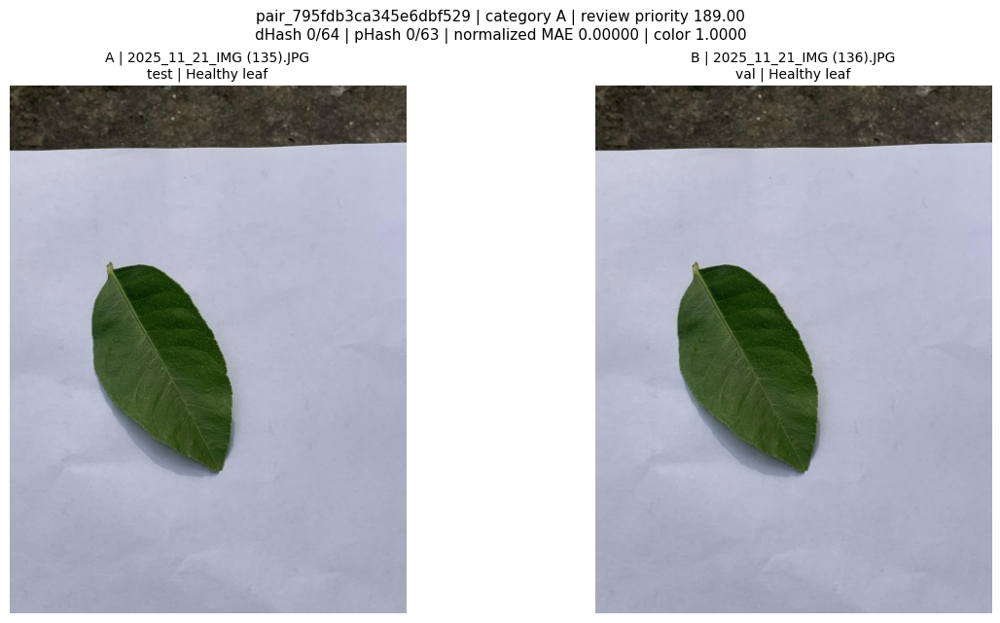

Record a decision for **pair_795fdb3ca345e6dbf529** in `manual_review_decisions.csv`. Current value: **blank**.

In [7]:
review_set('A. Exact cross-split duplicate', queue.loc[queue.category.eq("A")])


## 7B. Category B cross-split context


B. Category B cross-split context: 7 cases; 7 blank/UNSURE; showing up to 3.


,pair_id,review_group_id,split_combination,category,review_priority
38,pair_f753c3b3691a7451b88a,review_group_a3134a0064aa,train-test,B,385.574419
83,pair_565fc11e74d66d93cd28,review_group_a3134a0064aa,train-test,B,383.744792
223,pair_4bb39808055e3b4735e3,review_group_43fe1dc0e0b8,train-val,B,287.749043


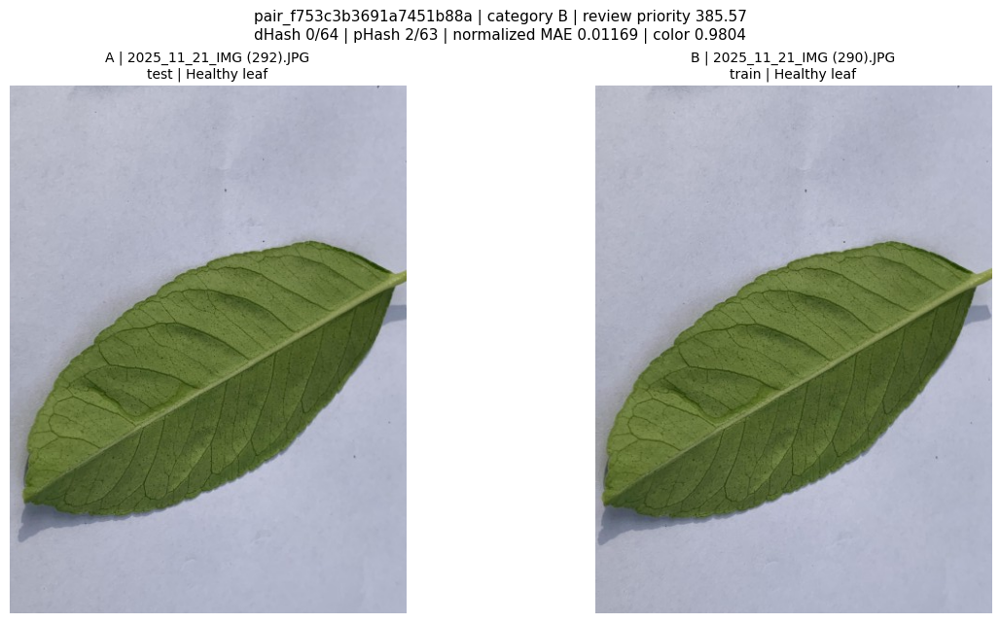

Record a decision for **pair_f753c3b3691a7451b88a** in `manual_review_decisions.csv`. Current value: **blank**.

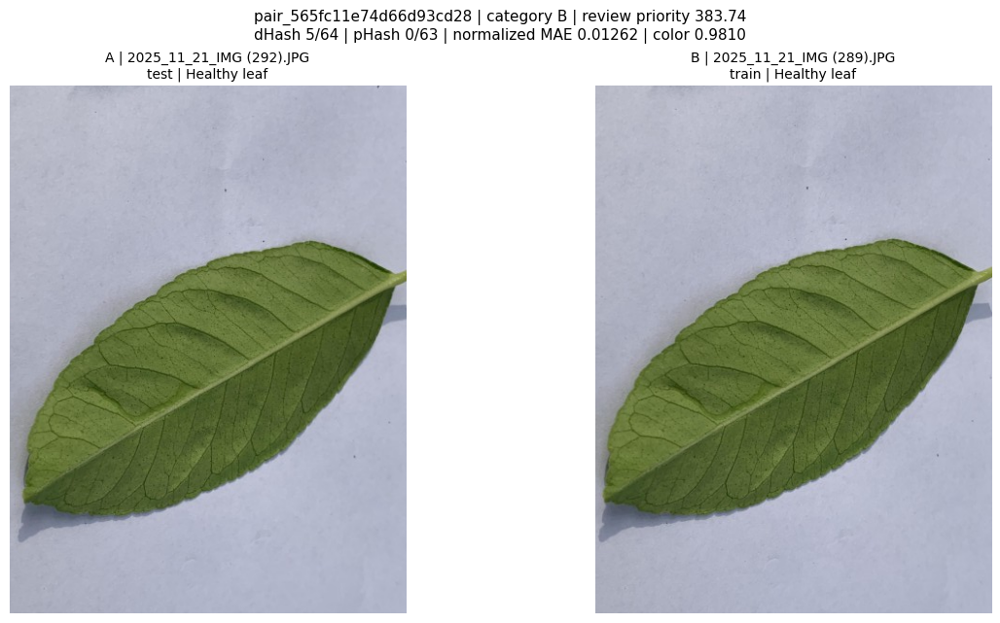

Record a decision for **pair_565fc11e74d66d93cd28** in `manual_review_decisions.csv`. Current value: **blank**.

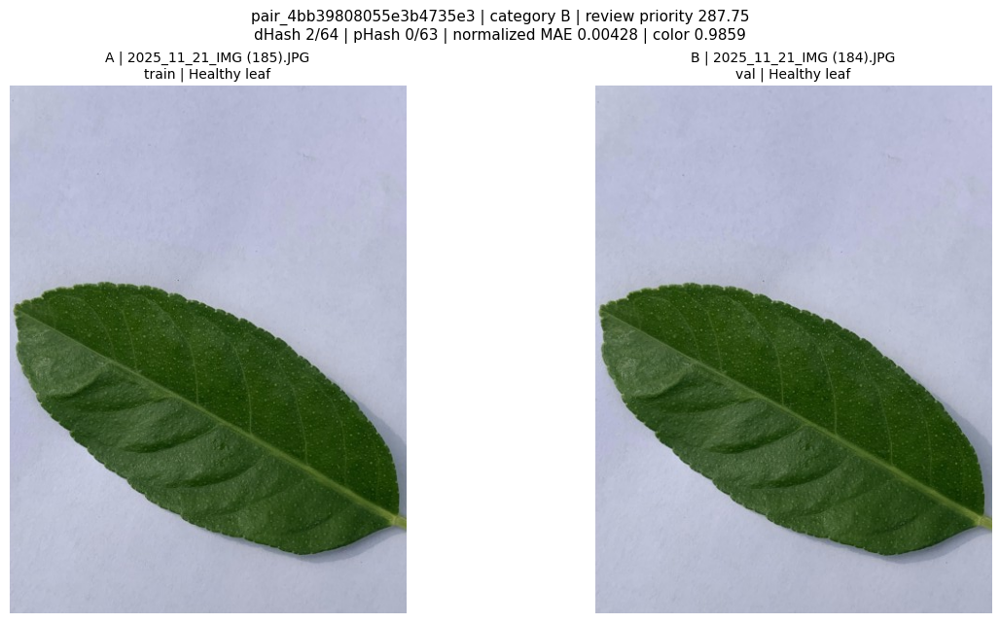

Record a decision for **pair_4bb39808055e3b4735e3** in `manual_review_decisions.csv`. Current value: **blank**.

In [8]:
review_set('B. Category B cross-split context', queue.loc[queue.category.eq("B")])


## 7C. dHash-zero cross-split C/D candidates


C. dHash-zero cross-split C/D candidates: 34 cases; 34 blank/UNSURE; showing up to 3.


,pair_id,review_group_id,split_combination,category,review_priority
0,pair_fda9158bbfa0a0780d61,review_group_4b8f78db0c25,train-test,C,388.048330
1,pair_3e0bf1dedea60d5059ca,review_group_3e0bf1dedea6,train-test,C,387.971546
10,pair_c8c00926705e98b6daa6,review_group_c8c00926705e,train-test,C,387.082423


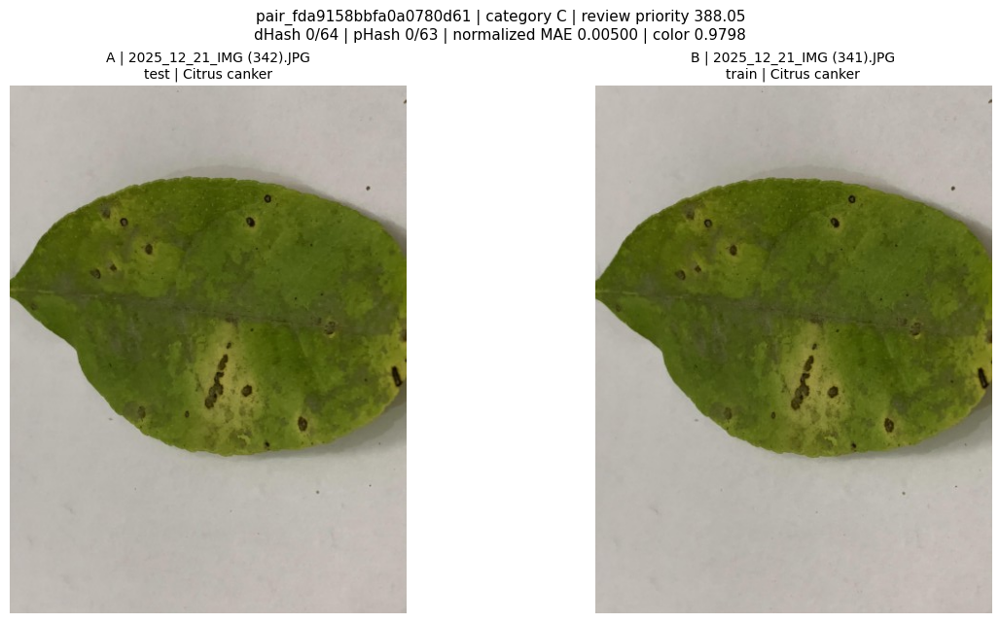

Record a decision for **pair_fda9158bbfa0a0780d61** in `manual_review_decisions.csv`. Current value: **blank**.

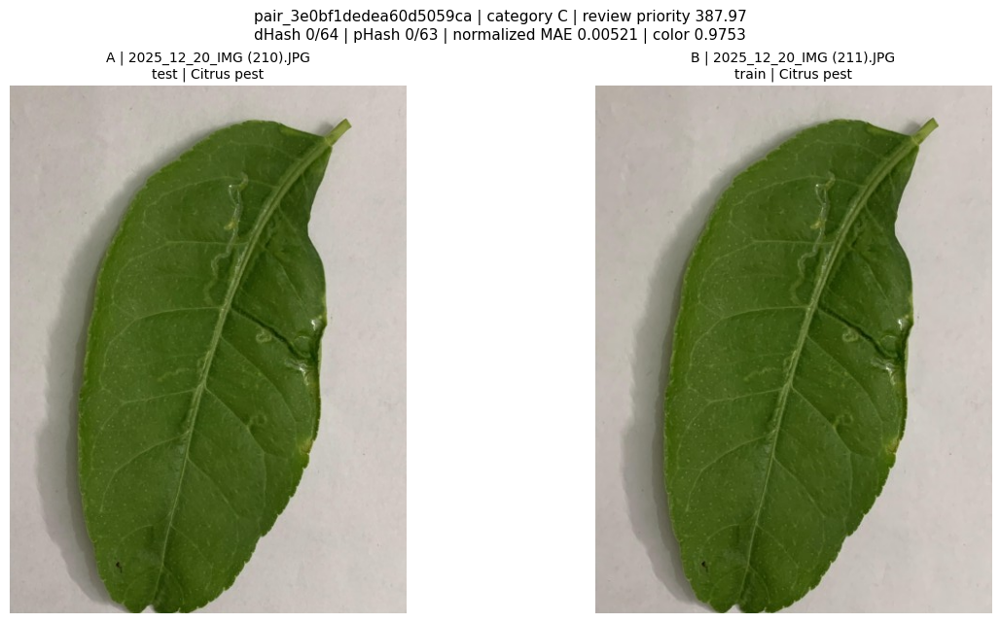

Record a decision for **pair_3e0bf1dedea60d5059ca** in `manual_review_decisions.csv`. Current value: **blank**.

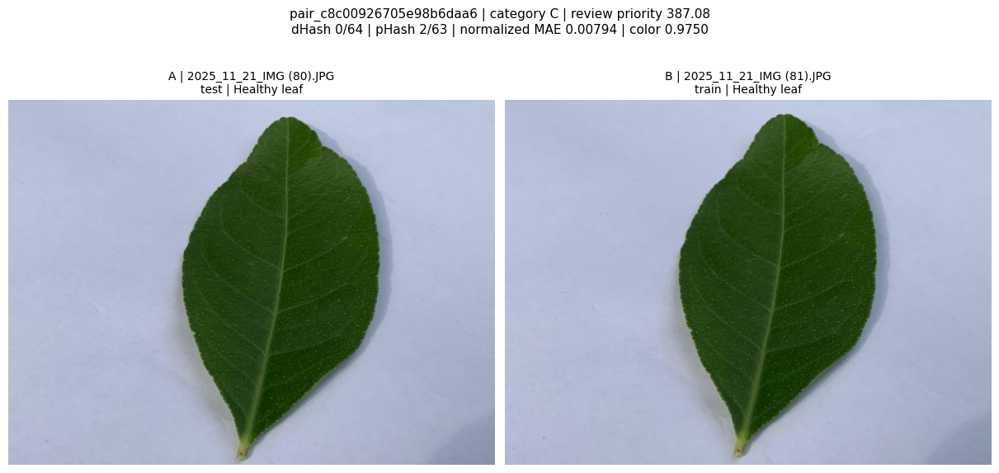

Record a decision for **pair_c8c00926705e98b6daa6** in `manual_review_decisions.csv`. Current value: **blank**.

In [9]:
review_set('C. dHash-zero cross-split C/D candidates', queue.loc[queue.category.isin(["C", "D"]) & queue.dhash_distance.eq(0)])


## 7D. Highest-priority train?test Category C pairs


D. Highest-priority train?test Category C pairs: 125 cases; 125 blank/UNSURE; showing up to 3.


,pair_id,review_group_id,split_combination,category,review_priority
0,pair_fda9158bbfa0a0780d61,review_group_4b8f78db0c25,train-test,C,388.048330
1,pair_3e0bf1dedea60d5059ca,review_group_3e0bf1dedea6,train-test,C,387.971546
2,pair_25a2694ff244012ff7bf,review_group_abd639bfd131,train-test,C,387.475988


Already shown: **pair_fda9158bbfa0a0780d61** ? `reports/dataset_audit/manual_review_contact_sheets/pair_fda9158bbfa0a0780d61.png`. Use the same decision row.

Already shown: **pair_3e0bf1dedea60d5059ca** ? `reports/dataset_audit/manual_review_contact_sheets/pair_3e0bf1dedea60d5059ca.png`. Use the same decision row.

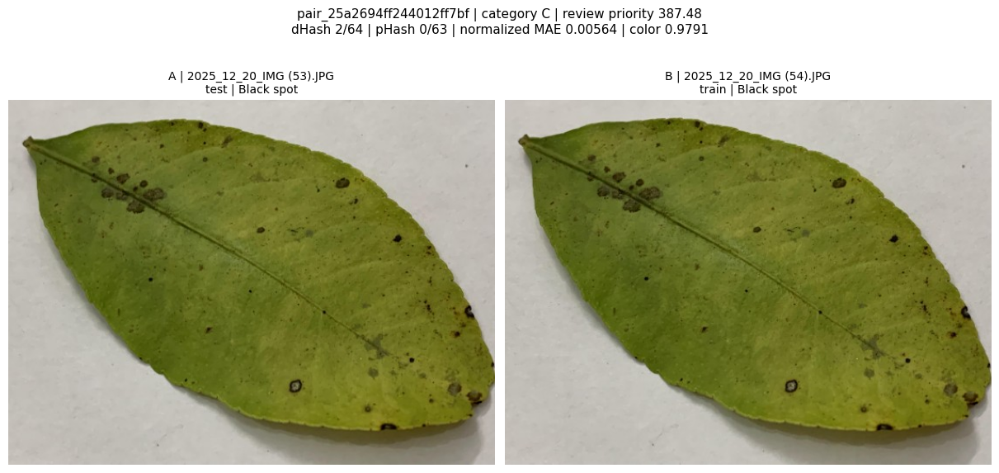

Record a decision for **pair_25a2694ff244012ff7bf** in `manual_review_decisions.csv`. Current value: **blank**.

In [10]:
review_set('D. Highest-priority train?test Category C pairs', queue.loc[queue.category.eq("C") & queue.split_combination.eq("train-test")])


## 7E. Highest-priority train?validation Category C pairs


E. Highest-priority train?validation Category C pairs: 124 cases; 124 blank/UNSURE; showing up to 3.


,pair_id,review_group_id,split_combination,category,review_priority
222,pair_48381a785fa9de1334c5,review_group_07dbe71e746e,train-val,C,287.778148
224,pair_a442766df9ed2d6e51a4,review_group_7c184f810a4e,train-val,C,287.563591
225,pair_e584d18b56c59e96416c,review_group_624939d4b768,train-val,C,287.512370


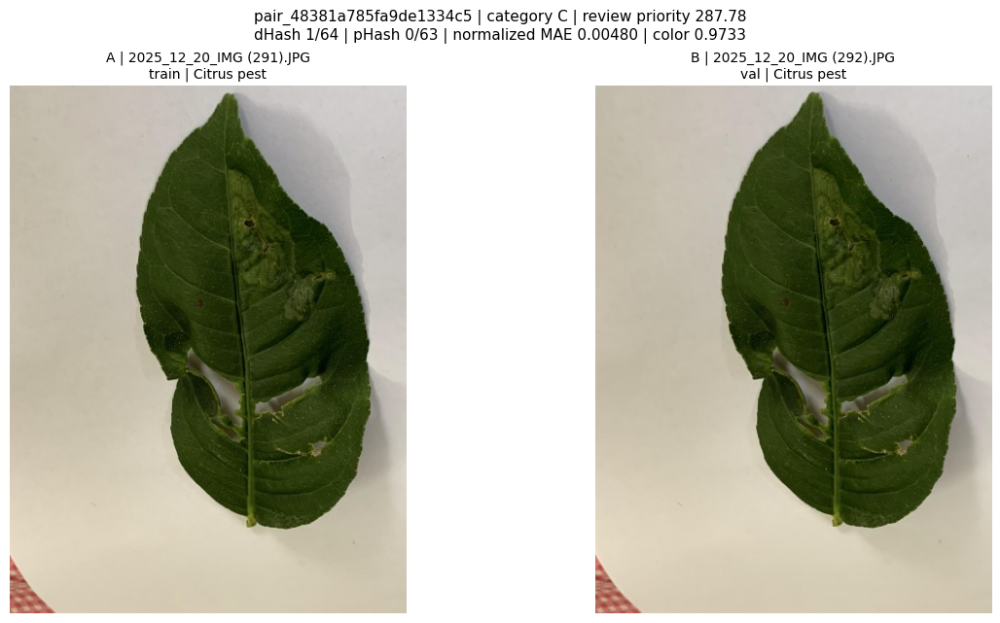

Record a decision for **pair_48381a785fa9de1334c5** in `manual_review_decisions.csv`. Current value: **blank**.

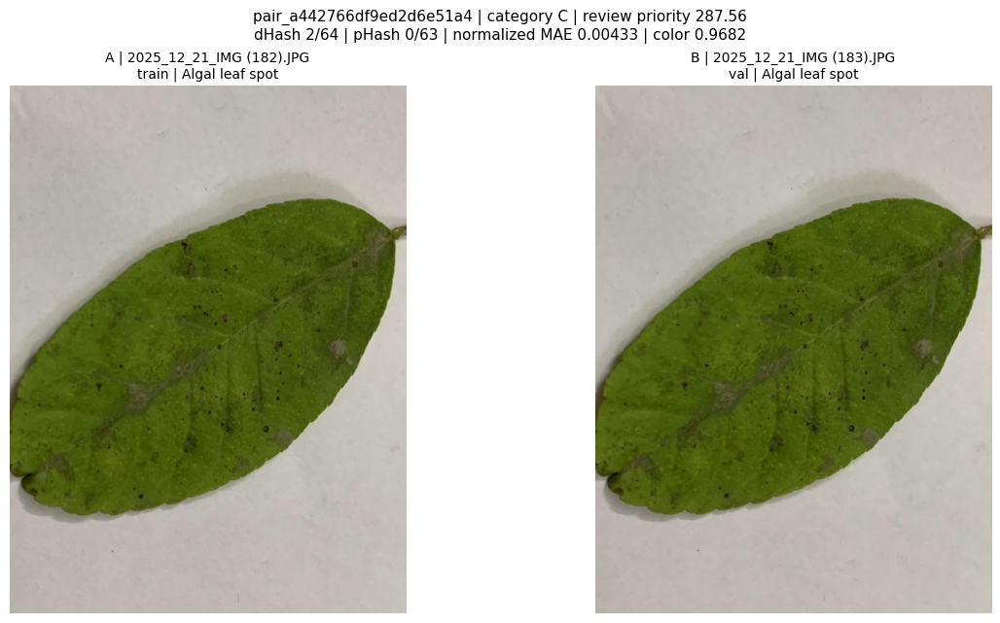

Record a decision for **pair_a442766df9ed2d6e51a4** in `manual_review_decisions.csv`. Current value: **blank**.

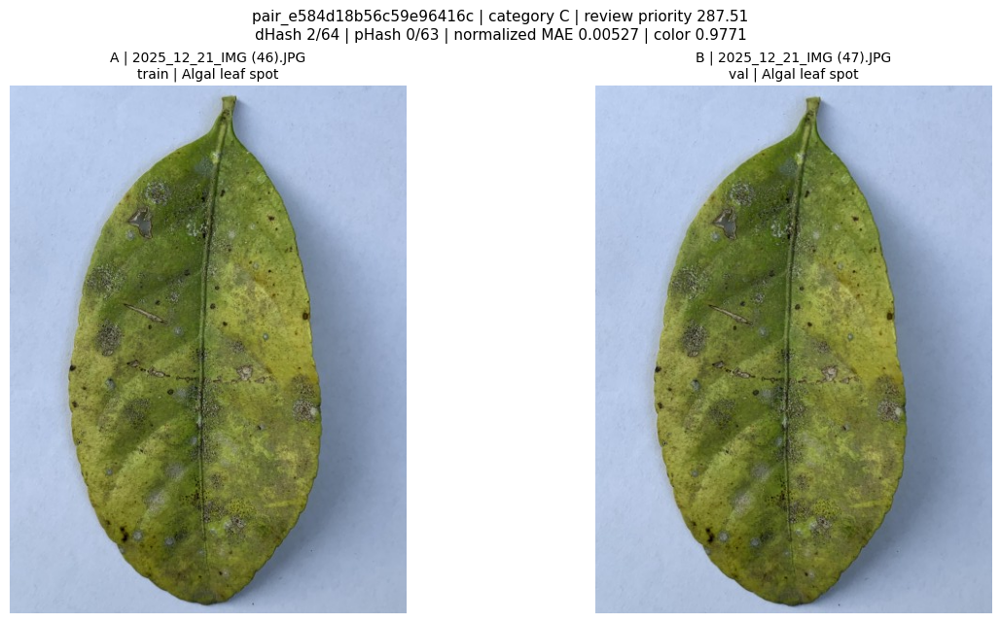

Record a decision for **pair_e584d18b56c59e96416c** in `manual_review_decisions.csv`. Current value: **blank**.

In [11]:
review_set('E. Highest-priority train?validation Category C pairs', queue.loc[queue.category.eq("C") & queue.split_combination.eq("train-val")])


## 7F. Highest-priority Category D pairs


F. Highest-priority Category D pairs: 243 cases; 243 blank/UNSURE; showing up to 3.


,pair_id,review_group_id,split_combination,category,review_priority
127,pair_c621b062bac97245fc32,review_group_bbea93a0b937,train-test,D,375.988568
128,pair_85e97433586a4883ba88,review_group_85e97433586a,train-test,D,375.930414
129,pair_d05a3e6695bc1e44e255,review_group_d05a3e6695bc,train-test,D,375.661716


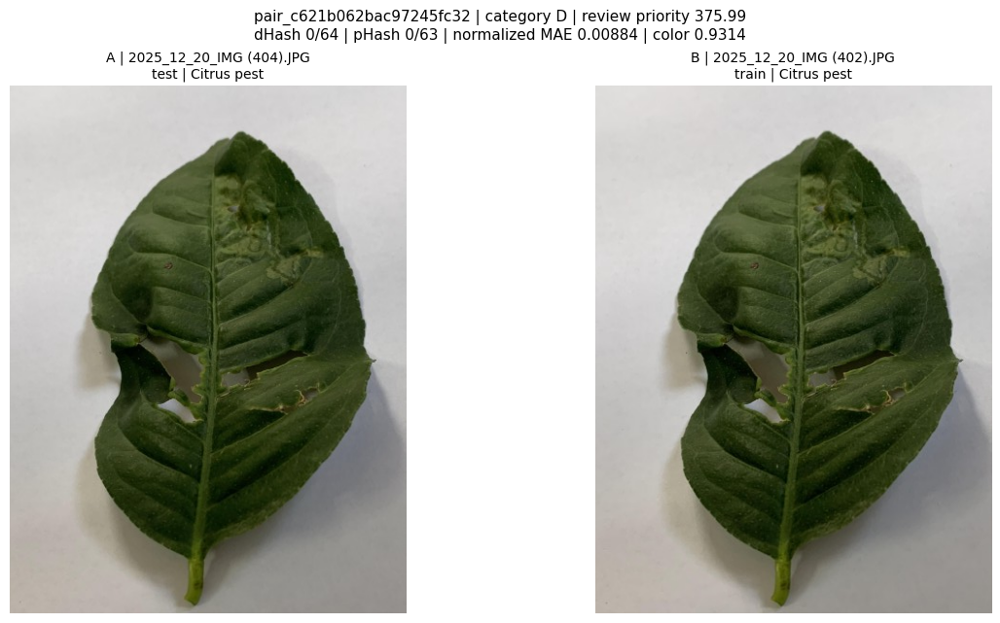

Record a decision for **pair_c621b062bac97245fc32** in `manual_review_decisions.csv`. Current value: **blank**.

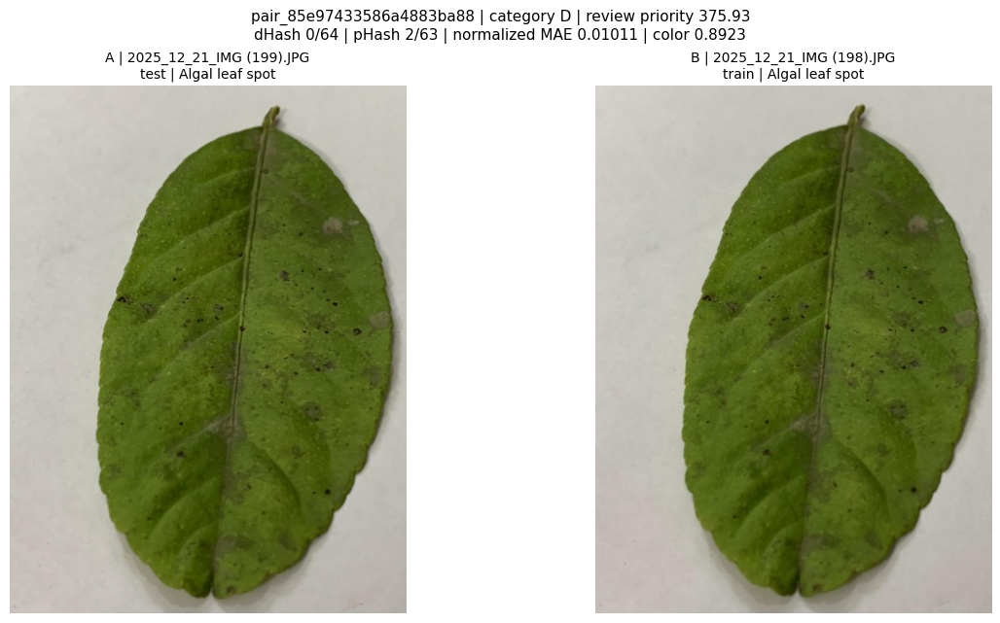

Record a decision for **pair_85e97433586a4883ba88** in `manual_review_decisions.csv`. Current value: **blank**.

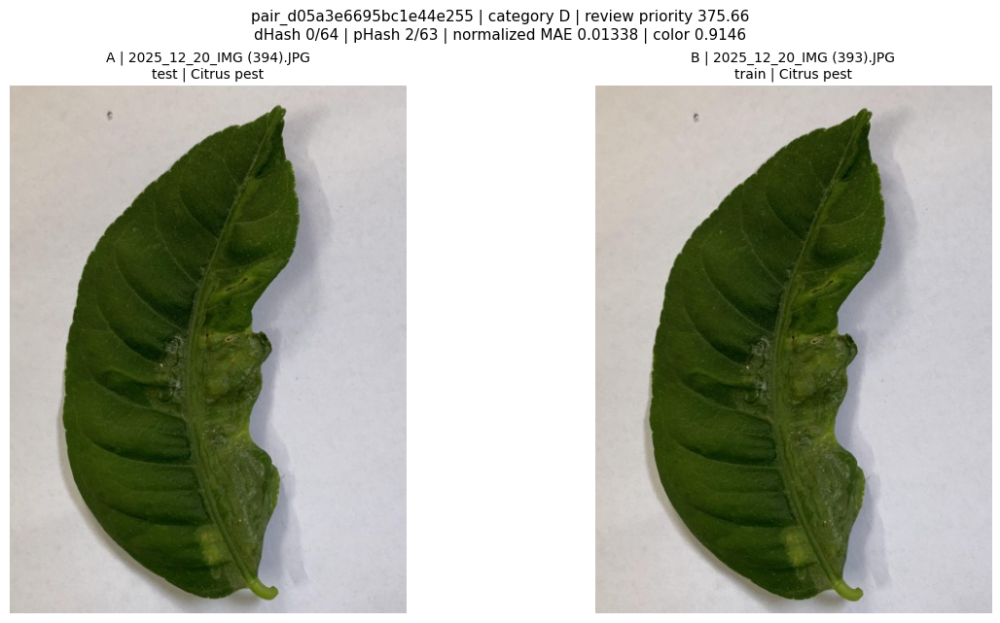

Record a decision for **pair_d05a3e6695bc1e44e255** in `manual_review_decisions.csv`. Current value: **blank**.

In [12]:
review_set('F. Highest-priority Category D pairs', queue.loc[queue.category.eq("D")])


## 7G. Suspicious sequential / capture-burst candidates
Only refined sequences with both filename and visual support are used. Display cross-split ambiguous relationships within them; the sequence remains a candidate requiring verification, not a specimen label.


In [13]:
sequence_cases = queue.loc[queue.category.isin(["C", "D"]) & queue.filepath_a.map(refined_map).notna() & queue.filepath_a.map(refined_map).eq(queue.filepath_b.map(refined_map))]
review_set("G. Refined capture-sequence ambiguity", sequence_cases)


G. Refined capture-sequence ambiguity: 222 cases; 222 blank/UNSURE; showing up to 3.


,pair_id,review_group_id,split_combination,category,review_priority
0,pair_fda9158bbfa0a0780d61,review_group_4b8f78db0c25,train-test,C,388.048330
1,pair_3e0bf1dedea60d5059ca,review_group_3e0bf1dedea6,train-test,C,387.971546
2,pair_25a2694ff244012ff7bf,review_group_abd639bfd131,train-test,C,387.475988


Already shown: **pair_fda9158bbfa0a0780d61** ? `reports/dataset_audit/manual_review_contact_sheets/pair_fda9158bbfa0a0780d61.png`. Use the same decision row.

Already shown: **pair_3e0bf1dedea60d5059ca** ? `reports/dataset_audit/manual_review_contact_sheets/pair_3e0bf1dedea60d5059ca.png`. Use the same decision row.

Already shown: **pair_25a2694ff244012ff7bf** ? `reports/dataset_audit/manual_review_contact_sheets/pair_25a2694ff244012ff7bf.png`. Use the same decision row.

## 8. Group-level review context
Review highest-priority components together to reuse visual context. Component size can reflect transitive chains; decisions remain pair-specific. This section does not propagate SAME_SOURCE, DIFFERENT, or UNSURE to other rows.


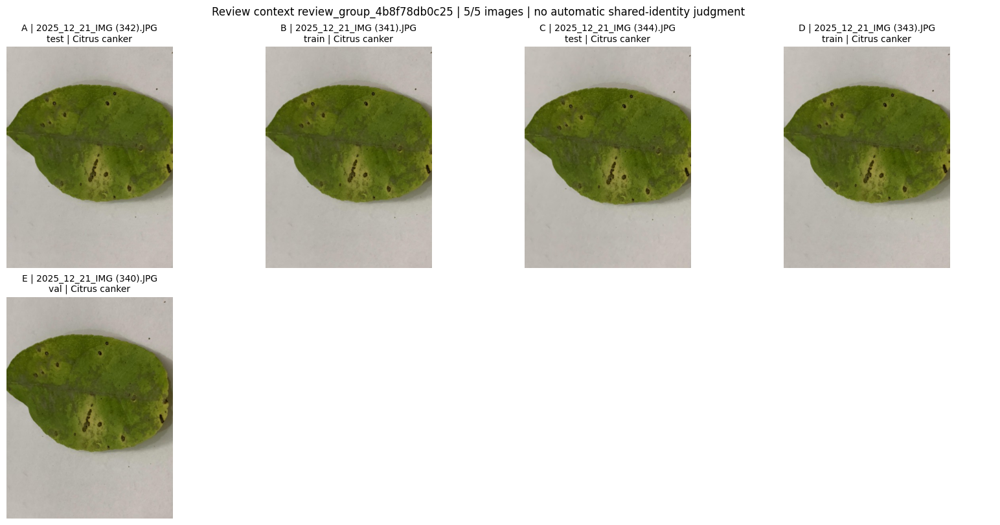

,pair_id,filename_a,filename_b,category,review_priority,dhash_distance,phash_distance,normalized_pixel_mae,color_histogram_intersection
0,pair_fda9158bbfa0a0780d61,2025_12_21_IMG (342).JPG,2025_12_21_IMG (341).JPG,C,388.048330,0,0,0.004999,0.979818
25,pair_4d69746519bf01c26e04,2025_12_21_IMG (344).JPG,2025_12_21_IMG (343).JPG,C,386.042479,1,2,0.013569,0.978841
50,pair_55204cd593d2a50d3dab,2025_12_21_IMG (342).JPG,2025_12_21_IMG (343).JPG,C,385.118718,2,2,0.016196,0.949300
96,pair_c1b5ae2a9428fe6b74c4,2025_12_21_IMG (344).JPG,2025_12_21_IMG (341).JPG,C,382.931851,3,0,0.019352,0.953776
388,pair_55d63031f24795128606,2025_12_21_IMG (341).JPG,2025_12_21_IMG (340).JPG,D,271.112904,5,6,0.029428,0.912760
415,pair_5825a8df75681a3532e7,2025_12_21_IMG (343).JPG,2025_12_21_IMG (340).JPG,D,269.200719,5,4,0.030374,0.888102
515,pair_ed31fd62e792a65c254b,2025_12_21_IMG (342).JPG,2025_12_21_IMG (340).JPG,D,170.067714,5,6,0.029610,0.910970
524,pair_dccb59ccf92d4ec994ea,2025_12_21_IMG (344).JPG,2025_12_21_IMG (340).JPG,D,167.116571,6,6,0.033331,0.895101


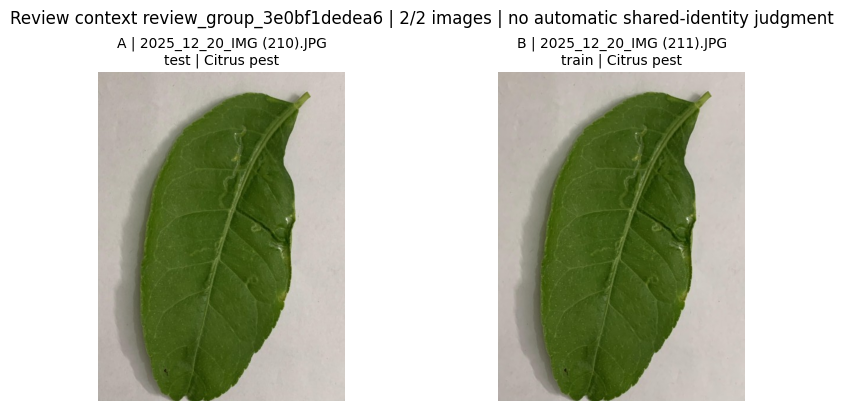

,pair_id,filename_a,filename_b,category,review_priority,dhash_distance,phash_distance,normalized_pixel_mae,color_histogram_intersection
1,pair_3e0bf1dedea60d5059ca,2025_12_20_IMG (210).JPG,2025_12_20_IMG (211).JPG,C,387.971546,0,0,0.005207,0.97526


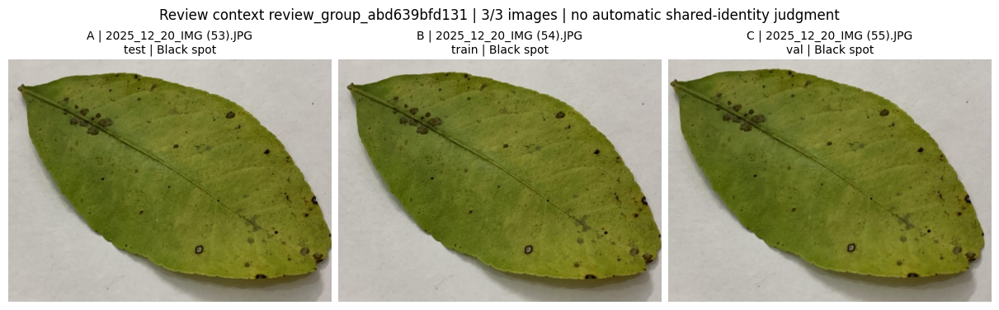

,pair_id,filename_a,filename_b,category,review_priority,dhash_distance,phash_distance,normalized_pixel_mae,color_histogram_intersection
2,pair_25a2694ff244012ff7bf,2025_12_20_IMG (53).JPG,2025_12_20_IMG (54).JPG,C,387.475988,2,0,0.005641,0.979085
407,pair_0c5fddbfe5c6374a3b97,2025_12_20_IMG (54).JPG,2025_12_20_IMG (55).JPG,D,269.815252,7,8,0.033863,0.944010


In [14]:
selected_context_ids = queue.loc[queue.category.isin(["C", "D"]), "review_group_id"].drop_duplicates().head(MAX_GROUP_SHEETS)
for group_id in selected_context_ids:
    edges = queue.loc[queue.review_group_id.eq(group_id)]
    show_context(group_id, context_members[group_id], edges)


## 9. Open any remaining review case
The bounded examples above do not exhaust the queue. Paste a `pair_id` below and rerun this cell to inspect another pair at full sheet size. The helper only displays evidence; it never writes decisions. Existing sheets may be reused via their stable filenames.


In [15]:
REVIEW_PAIR_ID = ""  # Paste a pair_id from the CSV here.
if REVIEW_PAIR_ID:
    show_pair(REVIEW_PAIR_ID, force=True)
else:
    print("Choose any pair_id from manual_review_queue.csv to display it here.")


Choose any pair_id from manual_review_queue.csv to display it here.


## 10. Review summary and read-only verification
Counts below use the expanded evaluated pool, with original-pool counts separately labeled. Unique images refer to the C/D queue unless stated otherwise. A/B controls are included in the decision file but not in the ambiguity count. A first-batch priority flag is a workload choice, not an identity threshold.


In [16]:
ambiguous_ids = set(queue.loc[queue.category.isin(["C", "D"]), "pair_id"])
zero_ambiguous = queue.loc[queue.category.isin(["C", "D"]) & queue.dhash_distance.eq(0)]
original_zero_ids = {stable_pair_id(a, b) for a, b in zero_input.loc[zero_input.category.isin(["C", "D"]) & zero_input.cross_split, ["filepath_a", "filepath_b"]].itertuples(index=False, name=None)}
assert original_zero_ids <= set(zero_ambiguous.pair_id)
unique_ambiguous = set(queue.loc[queue.pair_id.isin(ambiguous_ids), "filepath_a"]) | set(queue.loc[queue.pair_id.isin(ambiguous_ids), "filepath_b"])
AFTER = snapshot()
assert BEFORE == AFTER, "Dataset membership/content/mtime changed during execution."
assert INPUT_HASHES == {name: file_hash(REPORTS / name) for name in INPUT_NAMES}, "An input report changed."
assert file_hash(DECISION_PATH) == DECISIONS_AT_START, "The decision file changed during this run; review before continuing."
latest_decisions = pd.read_csv(DECISION_PATH, keep_default_na=False)
validate_decisions(latest_decisions, expected)
summary = {
    "schema_version": 1, "total_images": len(inventory), "human_review_cases": len(queue),
    "cross_split_C_pairs": int(queue.category.eq("C").sum()),
    "cross_split_D_pairs": int(queue.category.eq("D").sum()),
    "original_pool_C_pairs": int((similarity.cross_split & similarity.is_audit_near_candidate & similarity.category.eq("C")).sum()),
    "original_pool_D_pairs": int((similarity.cross_split & similarity.is_audit_near_candidate & similarity.category.eq("D")).sum()),
    "highest_priority_review_cases": len(priority_ids),
    "dhash_zero_cross_split_ambiguous_pairs": len(zero_ambiguous),
    "prior_capture_sequences": int(prior_sequences.capture_sequence_id.nunique()),
    "refined_capture_sequence_candidates": len(refined_groups),
    "unique_images_in_ambiguous_pairs": len(unique_ambiguous),
    "unique_images_in_all_review_cases": len(set(queue.filepath_a) | set(queue.filepath_b)),
    "logical_review_contexts": len(context_groups), "largest_context_size": max(map(len, context_groups), default=0),
    "blank_human_decisions": int(latest_decisions.human_decision.eq("").sum()),
    "decision_counts": latest_decisions.human_decision.replace("", "NOT REVIEWED").value_counts().to_dict(),
    "generated_pair_sheets": len(shown_pairs),
    "generated_context_sheets": sum(item["type"] == "context" for item in sheet_records),
    "dataset_unchanged": True, "existing_input_reports_unchanged": True,
    "decision_file_unchanged_after_initialization": True,
    "input_report_sha256": INPUT_HASHES,
    "priority_formula": "split base 300/200/100 + category C20/D10 (A/B20 context) + 15*(1-dHash/64) + 15*(1-pHash/63) + 15*clip(1-MAE/0.10) + 10*color + 5*same_class + 5*same_date + 5*clip(1-number_gap/5) when class/date agree; continuous contributions clipped to [0,weight]",
    "capture_refinement": "same prior sequence, class/date, number gap <=1, and A/B or C with pHash<=4, MAE<=0.03, color>=0.94; retain cross-split components only",
    "interpretation": "Priorities and groups organize human review only. No decisions populated automatically, no biological identity inferred, no new split or training."
}
(REPORTS / "manual_review_summary.json").write_text(json.dumps(summary, indent=2) + "\n", encoding="utf-8")
(REPORTS / "manual_review_contact_sheets.json").write_text(json.dumps(sheet_records, indent=2) + "\n", encoding="utf-8")
display(pd.Series({key: summary[key] for key in ["human_review_cases", "cross_split_C_pairs", "cross_split_D_pairs", "highest_priority_review_cases", "dhash_zero_cross_split_ambiguous_pairs", "refined_capture_sequence_candidates", "unique_images_in_ambiguous_pairs", "blank_human_decisions"]}, name="count").to_frame())
print("Verified: no image deleted, moved, renamed, or modified. Dataset split and prior reports preserved.")


Verified: no image deleted, moved, renamed, or modified. Dataset split and prior reports preserved.


,count
human_review_cases,527
cross_split_C_pairs,276
cross_split_D_pairs,243
highest_priority_review_cases,25
dhash_zero_cross_split_ambiguous_pairs,34
refined_capture_sequence_candidates,140
unique_images_in_ambiguous_pairs,729
blank_human_decisions,527


,cases
human_decision,
NOT REVIEWED,527


## 11. How to record decisions in VS Code
1. Open this notebook, select the Python environment containing the listed libraries, and **Run All**.
2. Open `reports/dataset_audit/manual_review_queue.csv`; start with `highest_priority_batch=True` and increasing `ambiguity_rank`. This queue contains evidence and review-group IDs; edit decisions in the separate decisions file.
3. Open `manual_review_decisions.csv` with a CSV-capable editor or the VS Code text editor. Find the matching stable `pair_id`. Inspect its sheet, related group context, and original images if needed. Use the `REVIEW_PAIR_ID` cell for cases not yet displayed.
4. Change only `human_decision` and `review_notes`. Enter exactly `SAME_SOURCE`, `DIFFERENT`, or `UNSURE`; leave blank if unreviewed. Quote notes containing commas or newlines using valid CSV syntax. Do not edit IDs, paths, classes, splits, or priority values.
5. Save the CSV. Run All again to validate allowed values and refresh completion counts. Existing decisions and notes are preserved without rewriting the file; default sheets focus on blank/UNSURE cases.

**Do not infer decisions for unreviewed edges from a graph component.** Explain SAME_SOURCE judgments, especially suspected shared leaves/capture bursts. Conflicting decisions within a component need later adjudication before changing grouping. This notebook does not propagate or apply decisions, rebuild a split, or change any image.
